### Import Libraries ###

In [2]:
%pip install tensorflow==2.0.0
%pip install chart_studio

import numpy as np 
import pandas as pd
import os

import tensorflow as tf
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight') 

%matplotlib inline
from pylab import rcParams
from plotly import tools
import chart_studio.plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
import statsmodels.api as sm

import math
import random

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement tensorflow==2.0.0 (from versions: 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0, 2.13.1, 2.14.0rc0, 2.14.0rc1, 2.14.0, 2.14.1, 2.15.0rc0, 2.15.0rc1, 2.15.0, 2.15.1, 2.16.0rc0, 2.16.1)
ERROR: No matching distribution found for tensorflow==2.0.0


Note: you may need to restart the kernel to use updated packages.


### Import Data

In [3]:
%%time
train_df = pd.read_csv('D:/Downloads/final-year-project/data/train.csv')
weather_train_df = pd.read_csv('D:/Downloads/final-year-project/data/weather_train.csv')
test_df = pd.read_csv('D:/Downloads/final-year-project/data/test.csv')
weather_test_df = pd.read_csv('D:/Downloads/final-year-project/data/weather_test.csv')
building_meta_df = pd.read_csv('D:/Downloads/final-year-project/data/building_metadata.csv')

CPU times: total: 24.7 s
Wall time: 43.5 s


### Data Shape

In [4]:
# Get shape and column names of train_df
print("Shape of train_df:", train_df.shape)
print("Column names of train_df:", train_df.columns.tolist())
print()

# Get shape and column names of weather_train_df
print("Shape of weather_train_df:", weather_train_df.shape)
print("Column names of weather_train_df:", weather_train_df.columns.tolist())
print()

# Get shape and column names of test_df
print("Shape of test_df:", test_df.shape)
print("Column names of test_df:", test_df.columns.tolist())
print()

# Get shape and column names of weather_test_df
print("Shape of weather_test_df:", weather_test_df.shape)
print("Column names of weather_test_df:", weather_test_df.columns.tolist())
print()

# Get shape and column names of building_meta_df
print("Shape of building_meta_df:", building_meta_df.shape)
print("Column names of building_meta_df:", building_meta_df.columns.tolist())


Shape of train_df: (20216100, 4)
Column names of train_df: ['building_id', 'meter', 'timestamp', 'meter_reading']

Shape of weather_train_df: (139773, 9)
Column names of weather_train_df: ['site_id', 'timestamp', 'air_temperature', 'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure', 'wind_direction', 'wind_speed']

Shape of test_df: (41697600, 4)
Column names of test_df: ['row_id', 'building_id', 'meter', 'timestamp']

Shape of weather_test_df: (277243, 9)
Column names of weather_test_df: ['site_id', 'timestamp', 'air_temperature', 'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure', 'wind_direction', 'wind_speed']

Shape of building_meta_df: (1449, 6)
Column names of building_meta_df: ['site_id', 'building_id', 'primary_use', 'square_feet', 'year_built', 'floor_count']


### Descriptive Summary

### Data Merging

In [5]:

train_df = train_df.merge(building_meta_df, on="building_id")
train_df = train_df.merge(weather_train_df, on=["site_id", "timestamp"])
test_df = test_df.merge(building_meta_df, on='building_id', how='left')
test_df = test_df.merge(weather_test_df, on=['site_id', 'timestamp'], how='left')

### Data Type Optimization for Memory Efficiency

In [6]:
d_types = {'building_id': np.int16,
          'meter': np.int8,
          'site_id': np.int8,
          'primary_use': 'category',
          'square_feet': np.int32,
          'year_built': np.float16,
          'floor_count': np.float16,
          'air_temperature': np.float16,
          'cloud_coverage': np.float16,
          'dew_temperature': np.float32,
          'precip_depth_1_hr': np.float16,
          'sea_level_pressure': np.float32,
          'wind_direction': np.float16,
          'wind_speed': np.float32}

for feature in d_types:
    train_df[feature] = train_df[feature].astype(d_types[feature])
    test_df[feature] = test_df[feature].astype(d_types[feature])

### Timestamp Data Type to Datetime Format

In [7]:
train_df["timestamp"] = pd.to_datetime(train_df["timestamp"])
test_df["timestamp"] = pd.to_datetime(test_df["timestamp"])

### Creation of new features "Month" and "Day" from the timestamp column

In [8]:
train_df['day'] = train_df['timestamp'].dt.day
test_df['day'] = test_df['timestamp'].dt.day

train_df['month'] = train_df['timestamp'].dt.month
test_df['month'] = test_df['timestamp'].dt.month

train_df['hour'] = train_df['timestamp'].dt.hour
test_df['hour'] = test_df['timestamp'].dt.hour

In [9]:
display( test_df.head() )
train_df.head()

,row_id,building_id,meter,timestamp,site_id,primary_use,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed,day,month,hour
0,0,0,0,2017-01-01,0,Education,7432,2008.0,NaN,17.796875,4.0,11.7,NaN,1021.400024,100.0,3.6,1,1,0
1,1,1,0,2017-01-01,0,Education,2720,2004.0,NaN,17.796875,4.0,11.7,NaN,1021.400024,100.0,3.6,1,1,0
2,2,2,0,2017-01-01,0,Education,5376,1991.0,NaN,17.796875,4.0,11.7,NaN,1021.400024,100.0,3.6,1,1,0
3,3,3,0,2017-01-01,0,Education,23685,2002.0,NaN,17.796875,4.0,11.7,NaN,1021.400024,100.0,3.6,1,1,0
4,4,4,0,2017-01-01,0,Education,116607,1975.0,NaN,17.796875,4.0,11.7,NaN,1021.400024,100.0,3.6,1,1,0


,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed,day,month,hour
0,0,0,2016-01-01,0.0,0,Education,7432,2008.0,NaN,25.0,6.0,20.0,NaN,1019.700012,0.0,0.0,1,1,0
1,1,0,2016-01-01,0.0,0,Education,2720,2004.0,NaN,25.0,6.0,20.0,NaN,1019.700012,0.0,0.0,1,1,0
2,2,0,2016-01-01,0.0,0,Education,5376,1991.0,NaN,25.0,6.0,20.0,NaN,1019.700012,0.0,0.0,1,1,0
3,3,0,2016-01-01,0.0,0,Education,23685,2002.0,NaN,25.0,6.0,20.0,NaN,1019.700012,0.0,0.0,1,1,0
4,4,0,2016-01-01,0.0,0,Education,116607,1975.0,NaN,25.0,6.0,20.0,NaN,1019.700012,0.0,0.0,1,1,0


### Creation of the Categorical Column out of the primary_use col

In [10]:
train_df['primary_use'] = pd.Categorical(train_df['primary_use'])
train_df['primary_use'] = train_df['primary_use'].cat.codes

test_df['primary_use'] = pd.Categorical( test_df['primary_use'])
test_df['primary_use'] = test_df['primary_use'].cat.codes

### Correlation Matrix

In [11]:
correlation_matrix = train_df.corr()
print(correlation_matrix)


C:\Users\joeyi\AppData\Local\Temp\ipykernel_26848\3431743375.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



                    building_id     meter  meter_reading   site_id  \
building_id            1.000000  0.222599       0.008848  0.980872   
meter                  0.222599  1.000000       0.017710  0.254355   
meter_reading          0.008848  0.017710       1.000000  0.011996   
site_id                0.980872  0.254355       0.011996  1.000000   
primary_use            0.058739 -0.081780      -0.009962  0.077539   
square_feet            0.088990  0.132866       0.024347  0.092335   
year_built            -0.247015 -0.002708       0.113314 -0.212689   
floor_count           -0.351263  0.175948       0.128825 -0.339595   
air_temperature       -0.314150 -0.011158      -0.004132 -0.307199   
cloud_coverage        -0.203832 -0.177186       0.006024 -0.179160   
dew_temperature       -0.110091 -0.080445      -0.003330 -0.135186   
precip_depth_1_hr      0.022868 -0.002283       0.000509  0.022575   
sea_level_pressure     0.075239 -0.052700      -0.004220  0.054179   
wind_direction      

C:\Users\joeyi\AppData\Local\Temp\ipykernel_26848\4202507411.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



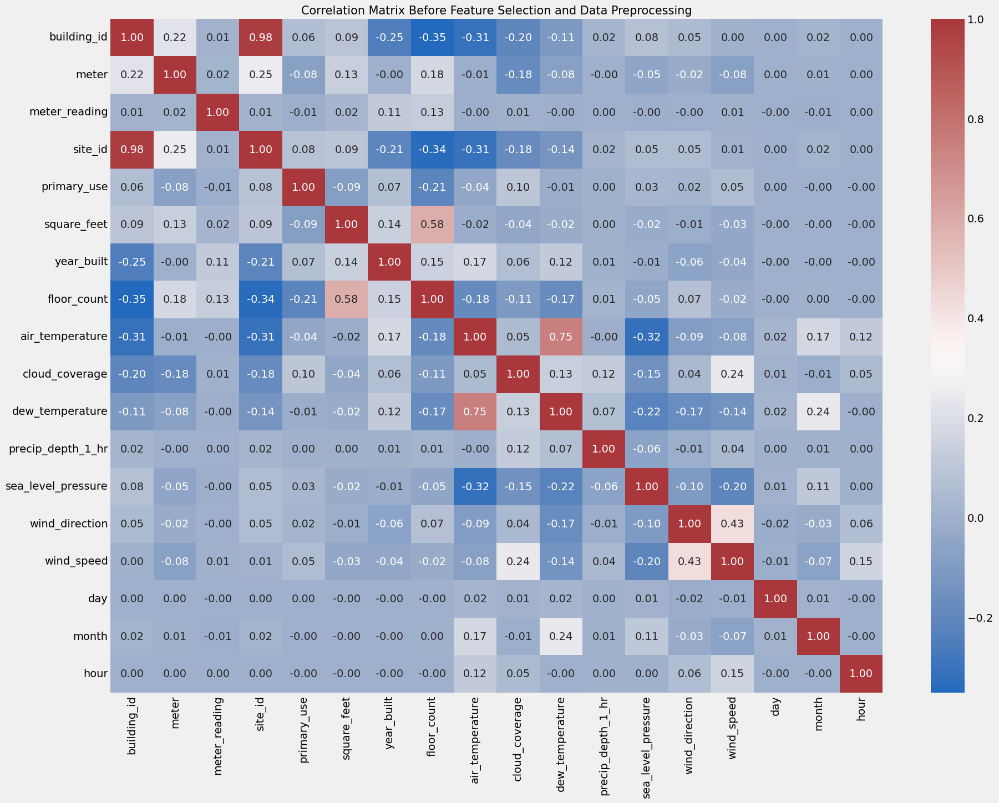

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Generate correlation matrix
correlation_matrix = train_df.corr()

# Plot heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='vlag', fmt=".2f")
plt.title('Correlation Matrix Before Feature Selection and Data Preprocessing', fontsize= 15)
plt.show()



In [13]:
correlation_matrix = train_df.corr()
print(correlation_matrix)

C:\Users\joeyi\AppData\Local\Temp\ipykernel_26848\737654371.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



                    building_id     meter  meter_reading   site_id  \
building_id            1.000000  0.222599       0.008848  0.980872   
meter                  0.222599  1.000000       0.017710  0.254355   
meter_reading          0.008848  0.017710       1.000000  0.011996   
site_id                0.980872  0.254355       0.011996  1.000000   
primary_use            0.058739 -0.081780      -0.009962  0.077539   
square_feet            0.088990  0.132866       0.024347  0.092335   
year_built            -0.247015 -0.002708       0.113314 -0.212689   
floor_count           -0.351263  0.175948       0.128825 -0.339595   
air_temperature       -0.314150 -0.011158      -0.004132 -0.307199   
cloud_coverage        -0.203832 -0.177186       0.006024 -0.179160   
dew_temperature       -0.110091 -0.080445      -0.003330 -0.135186   
precip_depth_1_hr      0.022868 -0.002283       0.000509  0.022575   
sea_level_pressure     0.075239 -0.052700      -0.004220  0.054179   
wind_direction      

### Missing Values

In [14]:
100 * train_df.isnull().sum() / len(train_df)

building_id            0.000000
meter                  0.000000
timestamp              0.000000
meter_reading          0.000000
site_id                0.000000
primary_use            0.000000
square_feet            0.000000
year_built            60.188531
floor_count           82.631315
air_temperature        0.030623
cloud_coverage        43.401776
dew_temperature        0.047924
precip_depth_1_hr     18.178475
sea_level_pressure     5.670259
wind_direction         6.750371
wind_speed             0.264245
day                    0.000000
month                  0.000000
hour                   0.000000
dtype: float64

In [15]:
del train_df['floor_count']
del train_df['year_built']
del test_df['floor_count']
del test_df['year_built']

### Handling of Outliers
#### 0: Electricity | 1: Chilled Water

In [16]:
train_df.drop(index=train_df[ train_df['meter'] > 1].index, inplace=True )

In [17]:
train_df.meter.unique()

array([0, 1], dtype=int8)

In [18]:
train_df.site_id.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15],
      dtype=int8)

In [19]:
train_df.isnull().sum()

building_id                 0
meter                       0
timestamp                   0
meter_reading               0
site_id                     0
primary_use                 0
square_feet                 0
air_temperature          4978
cloud_coverage        7006099
dew_temperature          7583
precip_depth_1_hr     2989395
sea_level_pressure    1057581
wind_direction        1015410
wind_speed              38276
day                         0
month                       0
hour                        0
dtype: int64

#### Visualization Mean of Energy Per Site

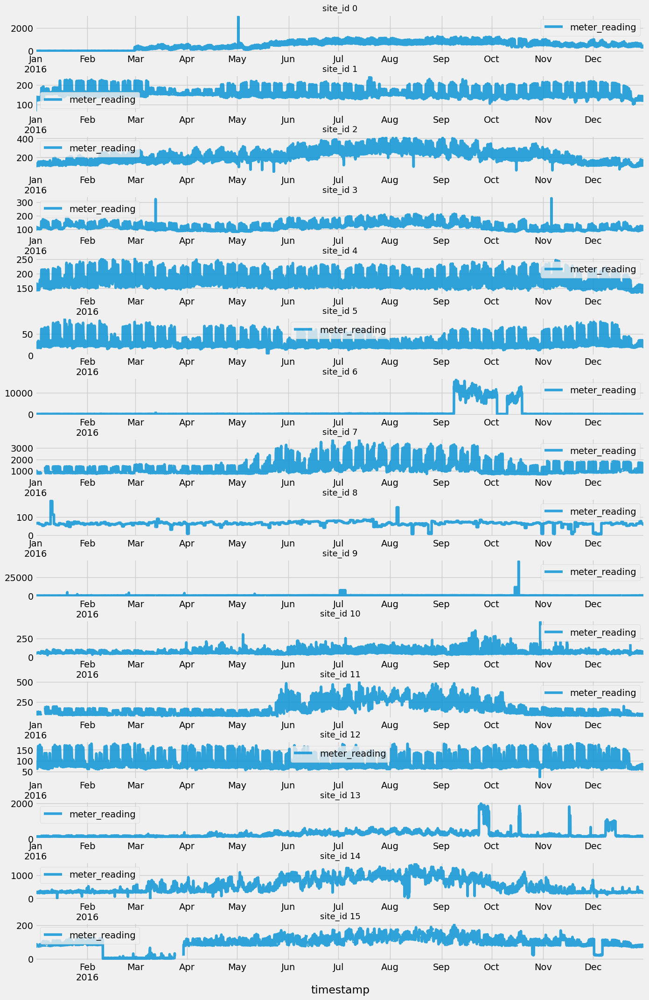

In [20]:
fig, axes = plt.subplots(16,figsize=(15, 25), dpi=100)
for i in range(train_df['site_id'].nunique()):
    try:
        train_df[train_df['site_id'] == i][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean().plot(ax=axes[i], alpha=0.8, label='By hour')
        axes[i].set_title('site_id {}'.format(i), fontsize=13);
        plt.subplots_adjust(hspace=0.6)
    except: pass

##### Checking Site 9

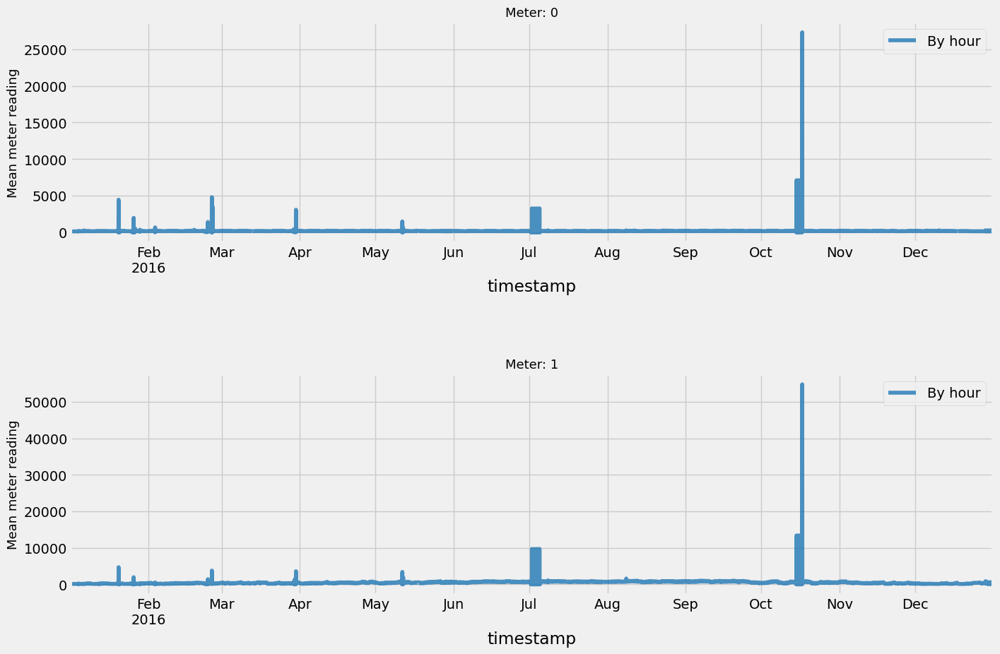

In [21]:
fig, axes = plt.subplots(2,1,figsize=(15, 10), dpi=100)
for i in list( train_df[(train_df['site_id'] == 9)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 9) & 
            (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i], 
            alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes[i].legend();
    axes[i].set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

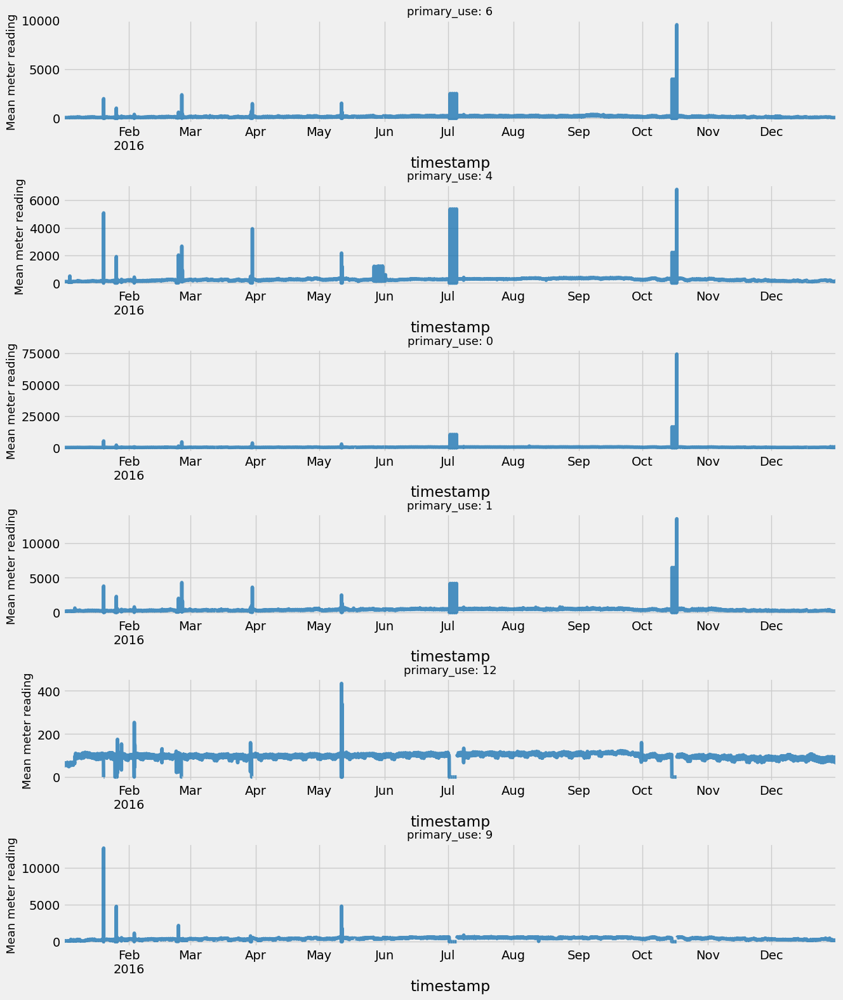

In [22]:
fig, axes = plt.subplots(6,1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( train_df[(train_df['site_id'] == 9)]['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 9) 
    & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], 
    alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

#### Clipping Values in Site 9

In [23]:
clipped_values= train_df[(train_df['site_id'] == 9)].meter_reading.clip( upper=200, axis=0)
clipped_idx= train_df[(train_df['site_id'] == 9)].index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

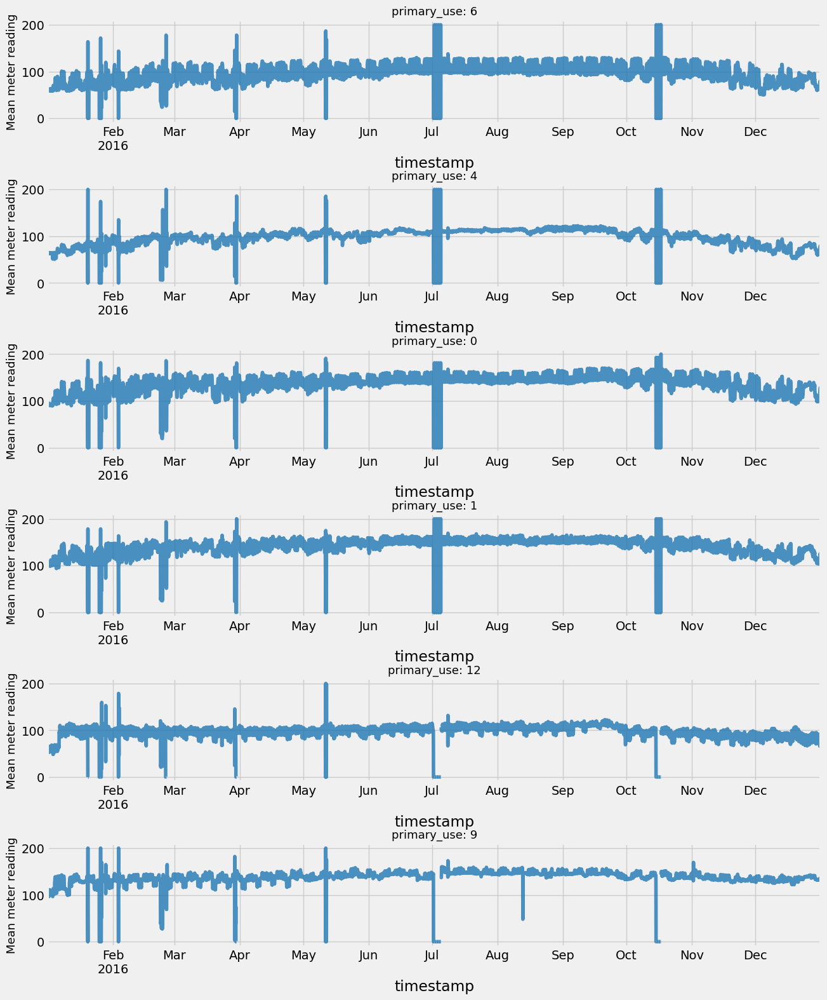

In [24]:
fig, axes = plt.subplots(6,1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( train_df[(train_df['site_id'] == 9)]['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 9) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    #train_df[ (train_df['site_id'] == 9) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').var()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:red').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Checking Site 13

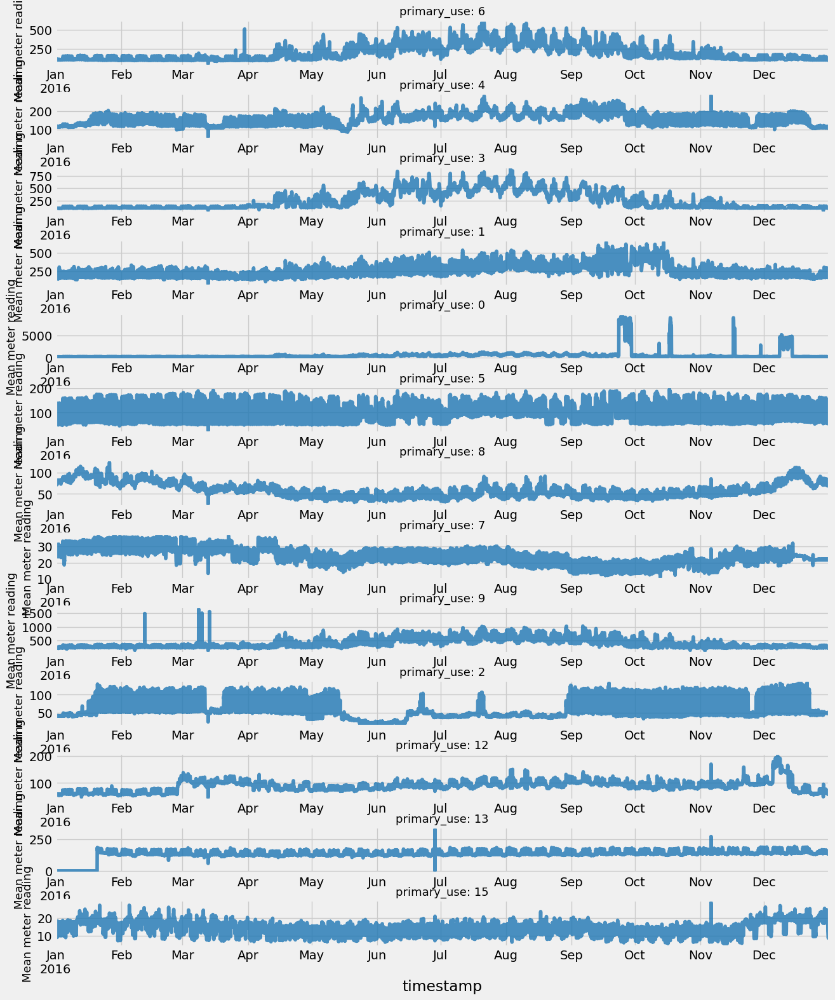

In [25]:
fig, axes = plt.subplots(len(train_df[(train_df['site_id'] == 13)]['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( train_df[(train_df['site_id'] == 13)]['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 13) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### decided to ditch site13's primary use 0

In [26]:
train_df.drop(index=train_df[ (train_df['site_id'] == 13) & (train_df['primary_use'] == 0) ].index, inplace=True )

### Showing the effect of dropping the outlier

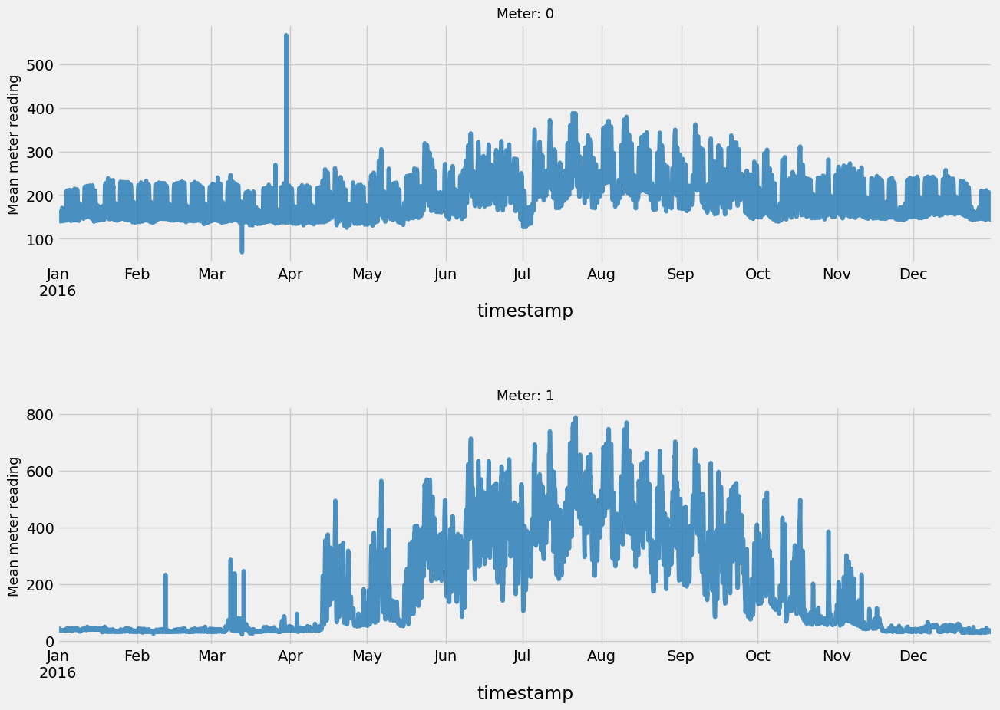

In [27]:

fig, axes = plt.subplots(2,1,figsize=(14, 10), dpi=100)
for i in list( train_df[(train_df['site_id'] == 13)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 13) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes[i].set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

### Clipping Values in Site 13

In [28]:
condition= train_df[(train_df['site_id'] == 13) & (train_df.meter == 1)]
clipped_values= condition.meter_reading.clip(upper=1000, axis=0)
clipped_idx= condition.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

In [29]:
condition= train_df[(train_df['site_id'] == 13) & (train_df.meter == 0) & (train_df.month.isin([3,4]) ) ]
clipped_values= condition.meter_reading.clip(upper=350, axis=0)
clipped_idx= condition.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

#### Visualize Site 13 again

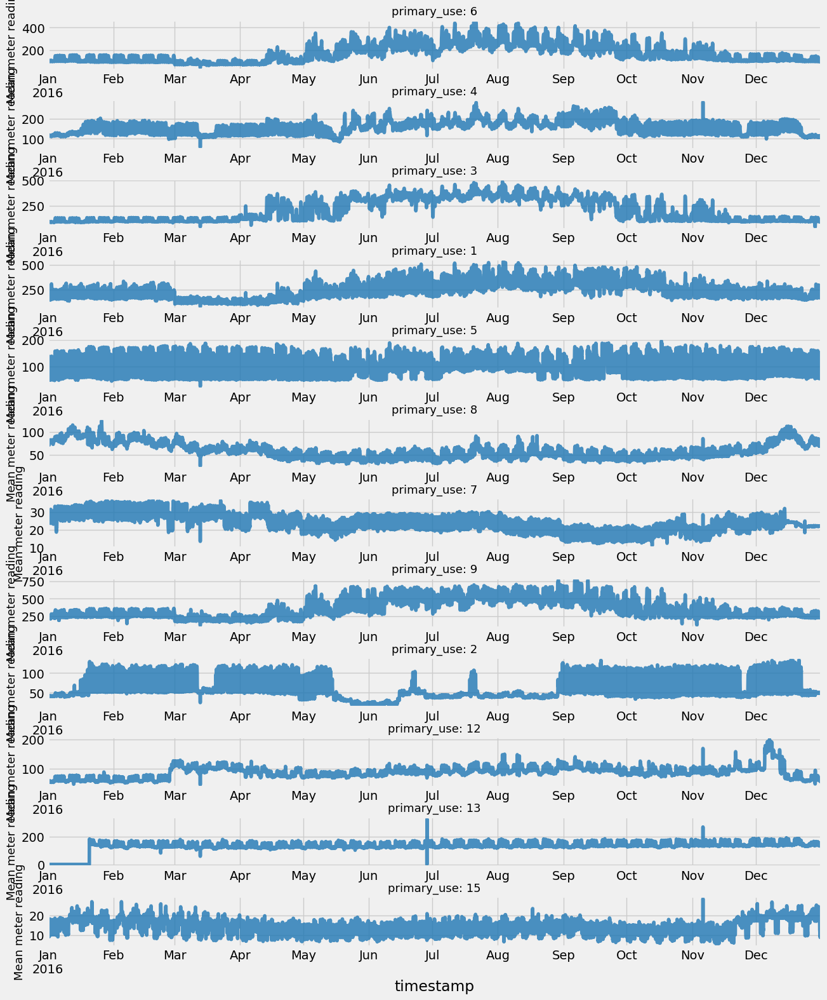

In [30]:
fig, axes = plt.subplots(len(train_df[(train_df['site_id'] == 13)]['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( train_df[(train_df['site_id'] == 13)]['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 13) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Checking Site 6

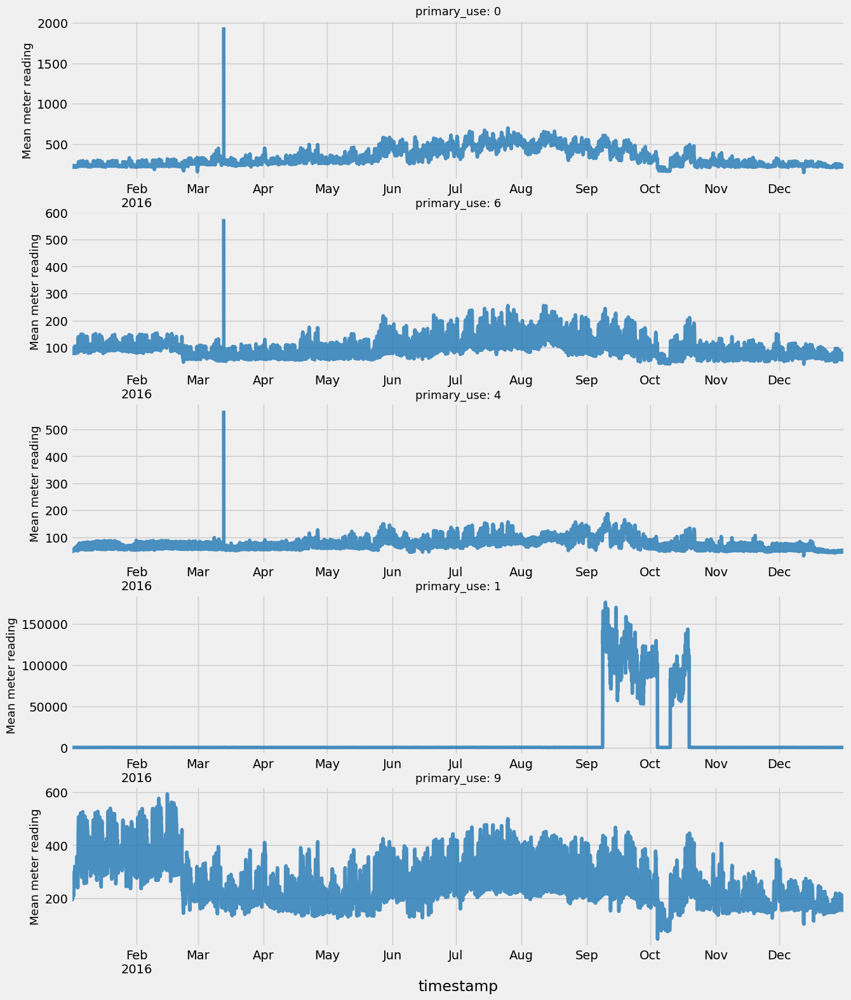

In [31]:
fig, axes = plt.subplots(len(train_df[(train_df['site_id'] == 6)]['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( train_df[(train_df['site_id'] == 6)]['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 6) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1

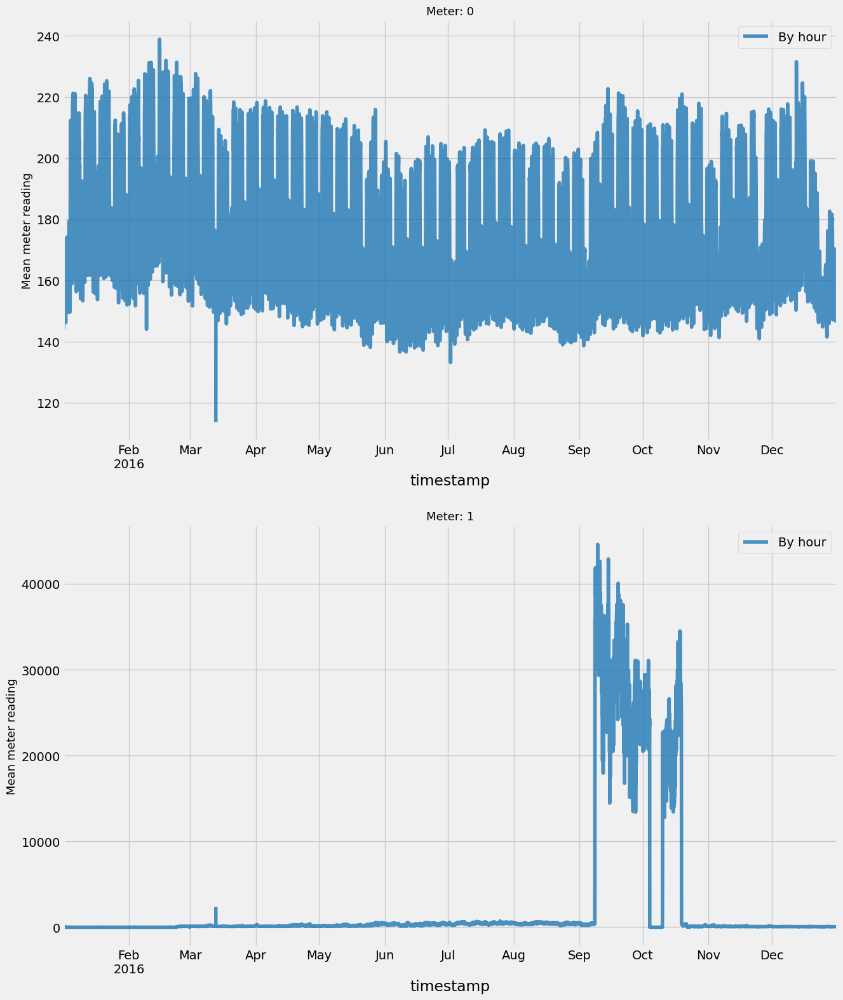

In [32]:
fig, axes = plt.subplots(2,1,figsize=(14, 18), dpi=100)
for i in list( train_df[(train_df['site_id'] == 6)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 6) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes[i].legend();
    axes[i].set_title('Meter: ' + str(i), fontsize=13);

### Primary_use 1 is the Outlier

In [33]:
train_df.drop(index=train_df[ (train_df['site_id'] == 6) & (train_df['primary_use'] == 1) ].index, inplace=True )

### Clipping Values in Site 6

In [34]:
condition= train_df[(train_df['site_id'] == 6) & (train_df.meter == 1) & (train_df.month == 3)]
clipped_values= condition.meter_reading.clip( upper=350, axis=0)
clipped_idx= condition.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

### Visualising Site 6 After Clipping 

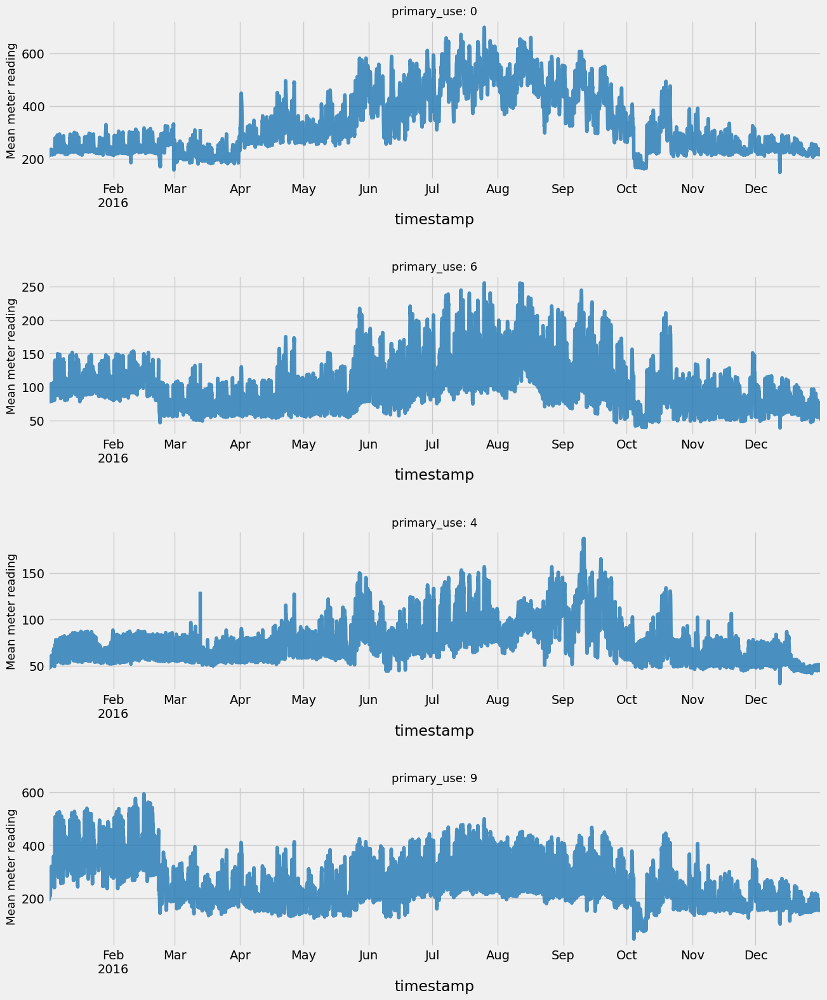

In [35]:
fig, axes = plt.subplots(len(train_df[(train_df['site_id'] == 6)]['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( train_df[(train_df['site_id'] == 6)]['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 6) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Checking Site 0

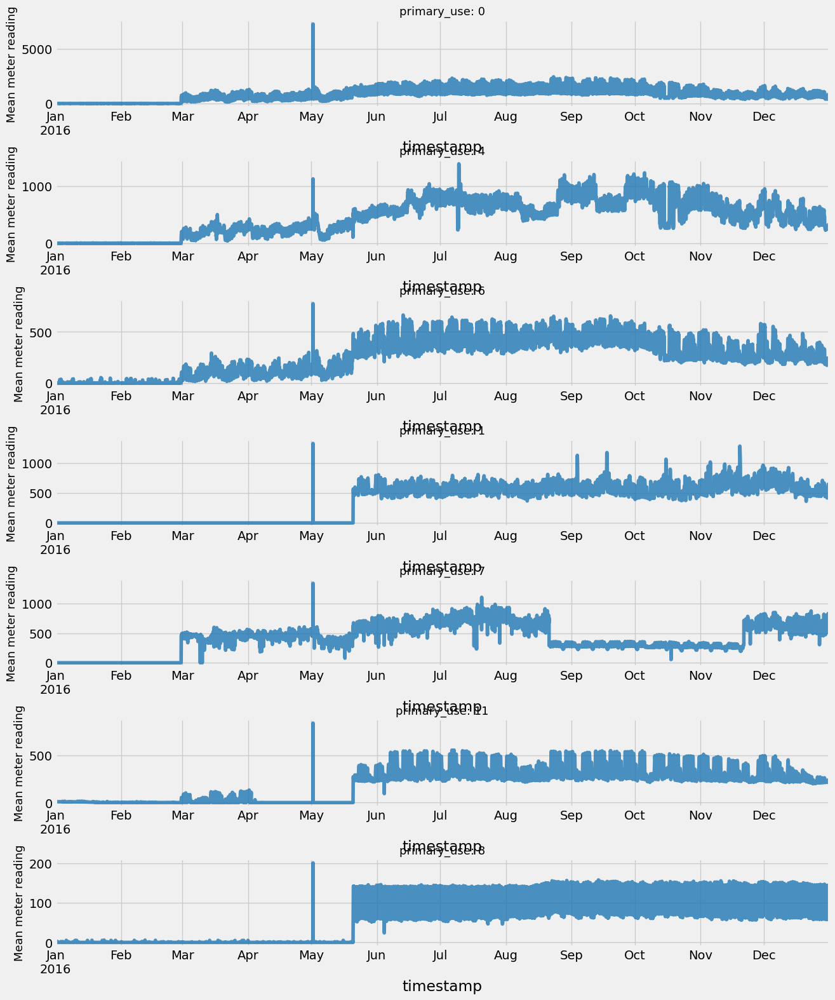

In [36]:
fig, axes = plt.subplots(len(train_df[(train_df['site_id'] == 0)]['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( train_df[(train_df['site_id'] == 0)]['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 0) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

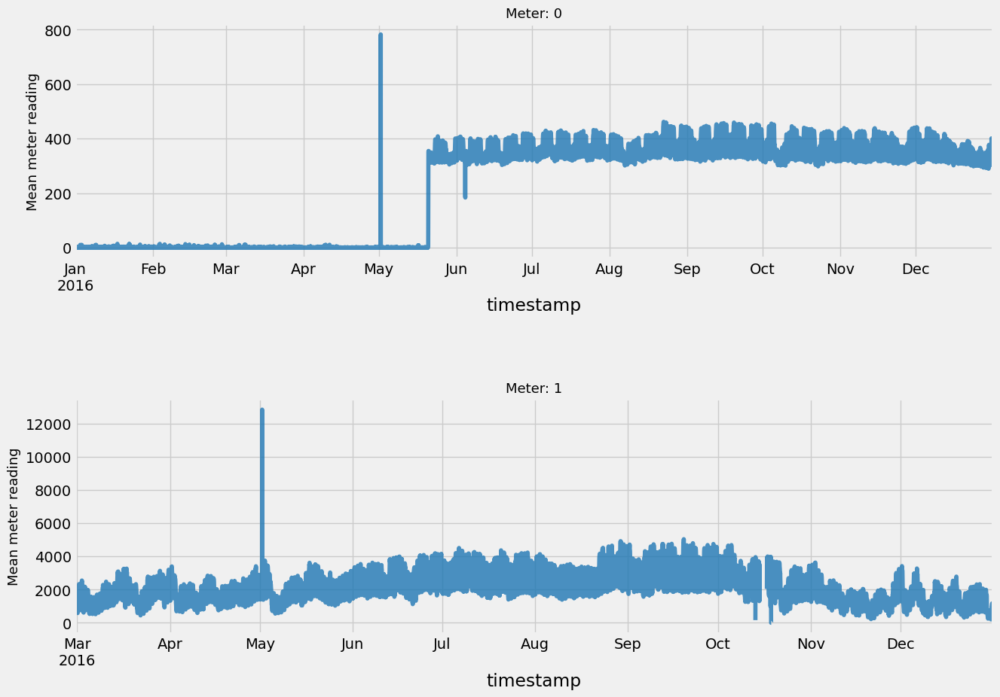

In [37]:
fig, axes = plt.subplots(2,1,figsize=(14, 10), dpi=100)
for i in list( train_df[(train_df['site_id'] == 0)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 0) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes[i].set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

### Site 0 the problem is with electricity

In [38]:
train_df.drop(index=train_df[ (train_df['site_id'] == 0) & (train_df['meter'] == 0) ].index, inplace=True )

### Visualizing every primary_use now

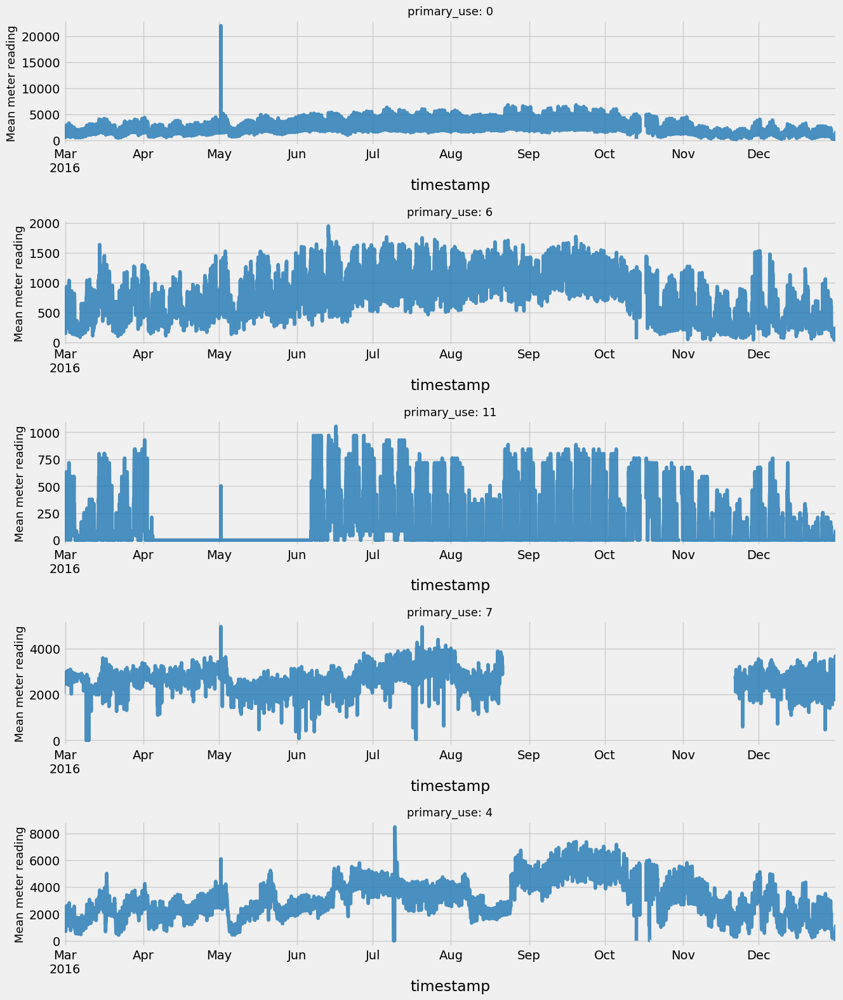

In [39]:
fig, axes = plt.subplots(len(train_df[(train_df['site_id'] == 0)]['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( train_df[(train_df['site_id'] == 0)]['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 0) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Clipping outliers in Site 0

In [40]:
clipped_values= train_df[(train_df['site_id'] == 0) & ( train_df.primary_use==0) & ( train_df.month==5) ].meter_reading.clip( upper=5000, axis=0)
clipped_idx= train_df[(train_df['site_id'] == 0) & ( train_df.primary_use==0) & ( train_df.month==5) ].index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

In [41]:
clipped_values= train_df[(train_df['site_id'] == 0) & ( train_df.primary_use==4) & ( train_df.month==7) ].meter_reading.clip( upper=5000, axis=0)
clipped_idx= train_df[(train_df['site_id'] == 0) & ( train_df.primary_use==4) & ( train_df.month==7) ].index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

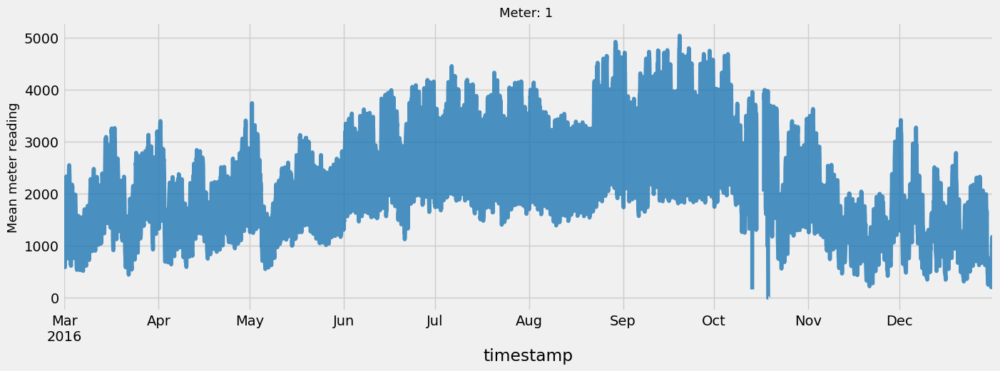

In [42]:
fig, axes = plt.subplots(1,1,figsize=(15, 5), dpi=100)
train_df[(train_df['site_id'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
axes.set_title('Meter: 1 ', fontsize=13);

### Visualizing again for the primary_use after removing

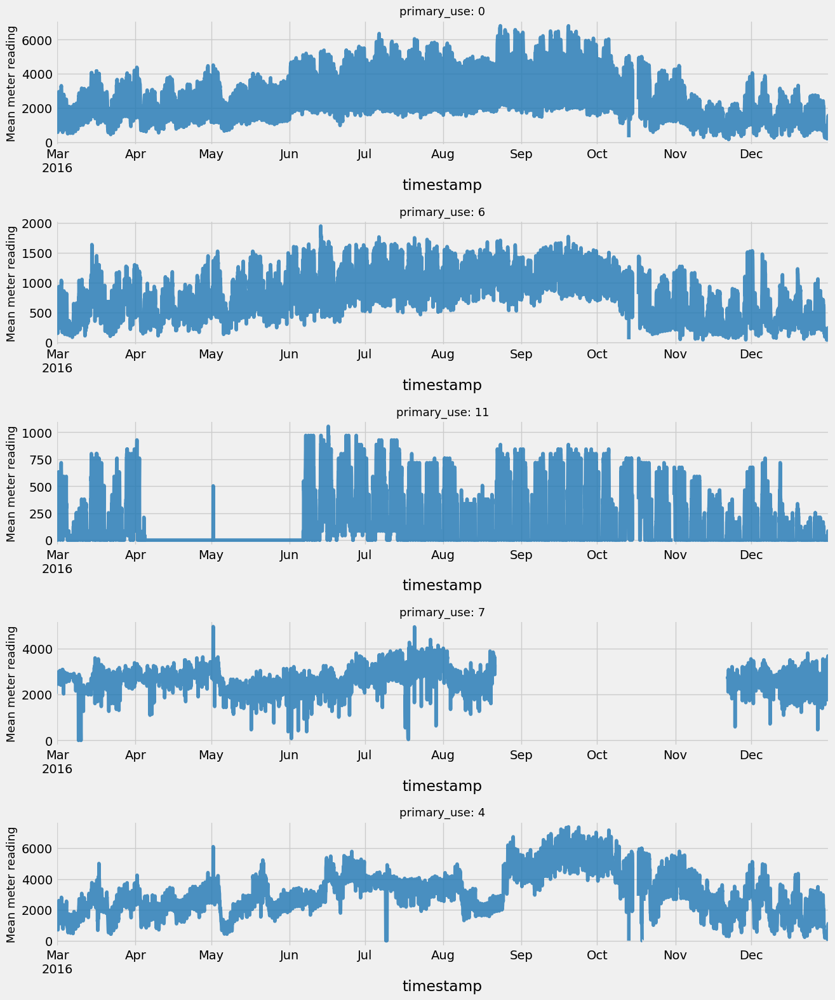

In [43]:
fig, axes = plt.subplots(len(train_df[(train_df['site_id'] == 0)]['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( train_df[(train_df['site_id'] == 0)]['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 0) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Checking site 9

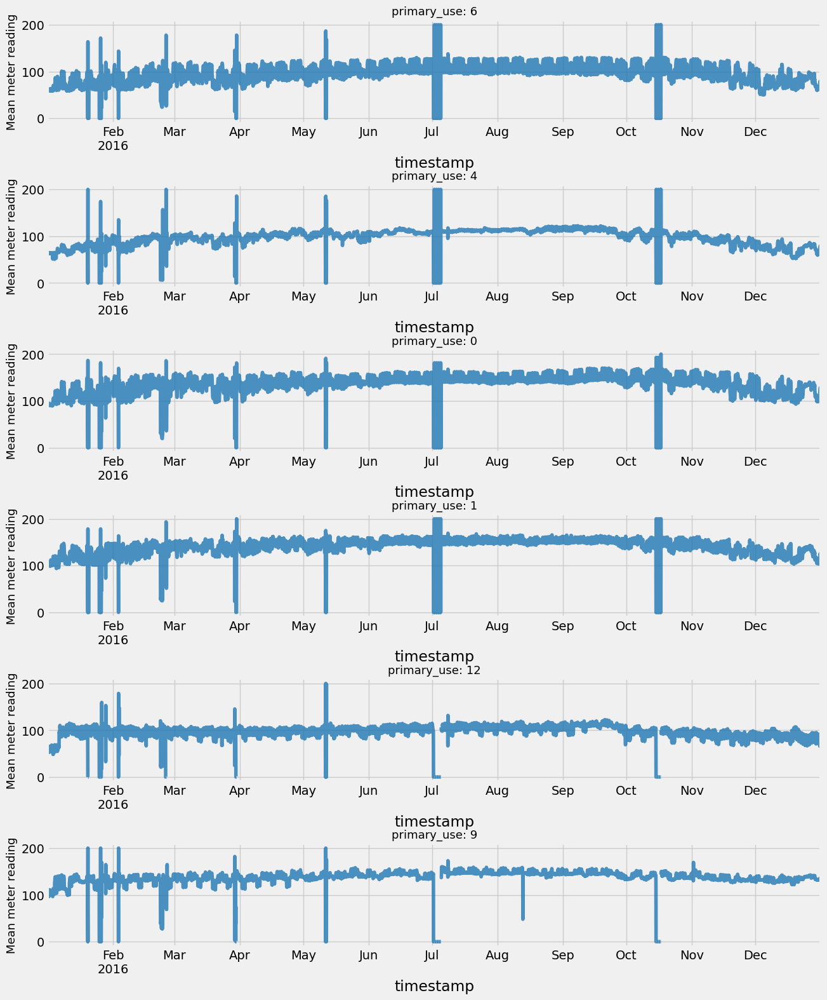

In [44]:
cond= train_df[(train_df['site_id'] == 9)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 9) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Clipping in Site 9

In [45]:
condition_df= train_df[(train_df['site_id'] == 9) & ( train_df.primary_use==6)  ]
clipped_values= condition_df.meter_reading.clip( upper=40, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

In [46]:
condition_df= train_df[(train_df['site_id'] == 9) & ( train_df.primary_use==12)  ]
clipped_values= condition_df.meter_reading.clip( upper=85, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

In [47]:
condition_df= train_df[(train_df['site_id'] == 9) & ( train_df.primary_use==4)  ]
clipped_values= condition_df.meter_reading.clip( upper=30, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

In [48]:
condition_df= train_df[(train_df['site_id'] == 9) & ( train_df.primary_use.isin([9,1]) ) ]
clipped_values= condition_df.meter_reading.clip( upper=100, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

### Visualise after Clipping at Site 9

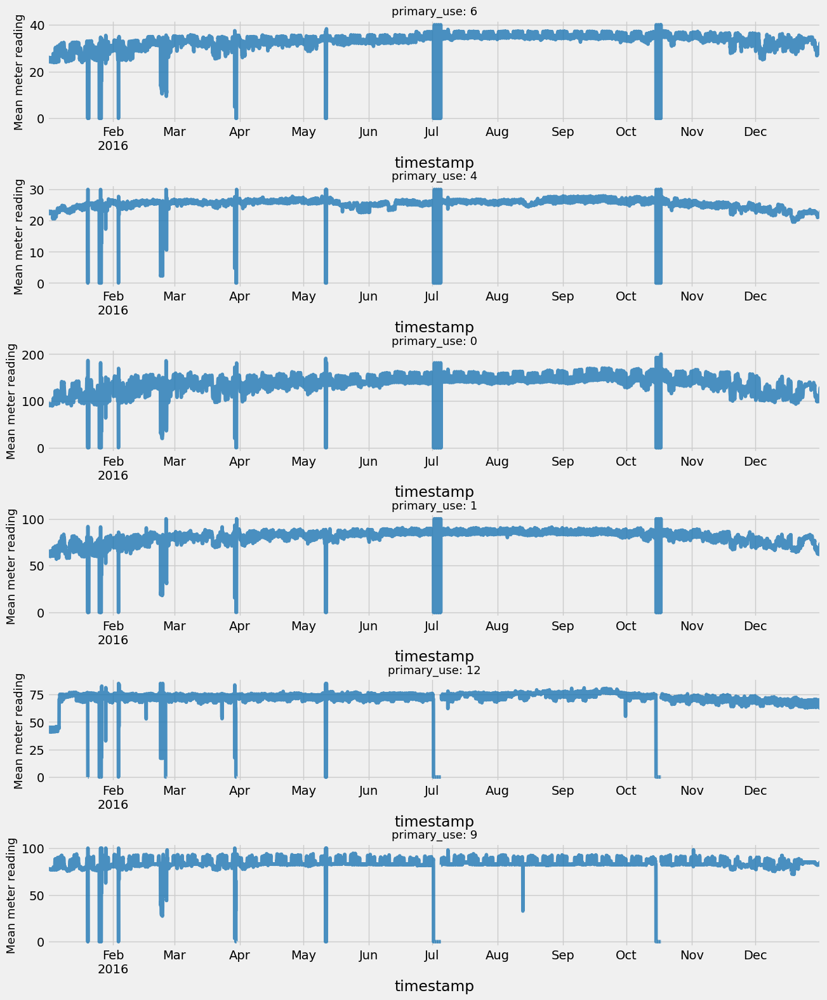

In [49]:
cond= train_df[(train_df['site_id'] == 9)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 9) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Checking Site 8

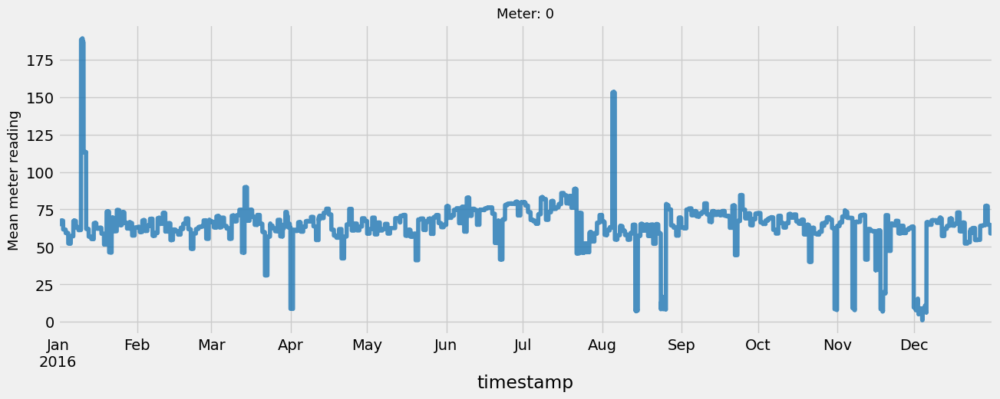

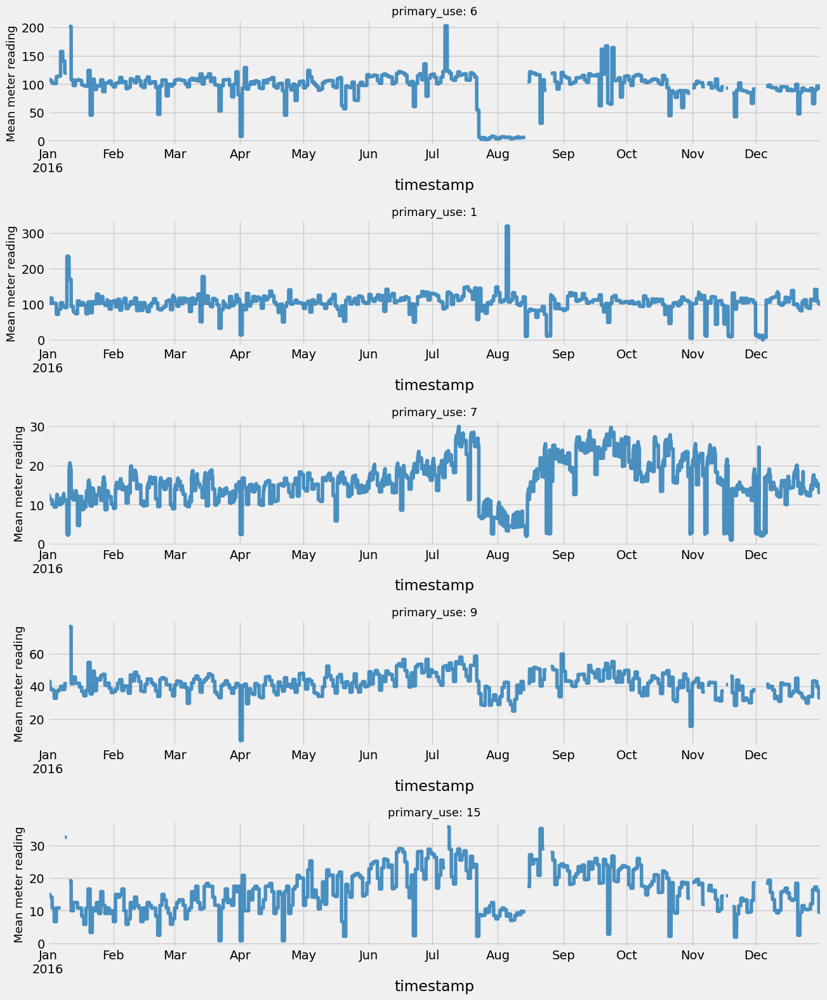

In [50]:
fig, axes = plt.subplots(1,1,figsize=(14, 5), dpi=100)
for i in list( train_df[(train_df['site_id'] == 8)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 8) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes.set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

cond= train_df[(train_df['site_id'] == 8)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 8) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Clipping at Site 8

In [51]:
condition_df= train_df[(train_df['site_id'] == 8) ]
clipped_values= condition_df.meter_reading.clip( upper=40, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

### Visualizing after clipping at site 8

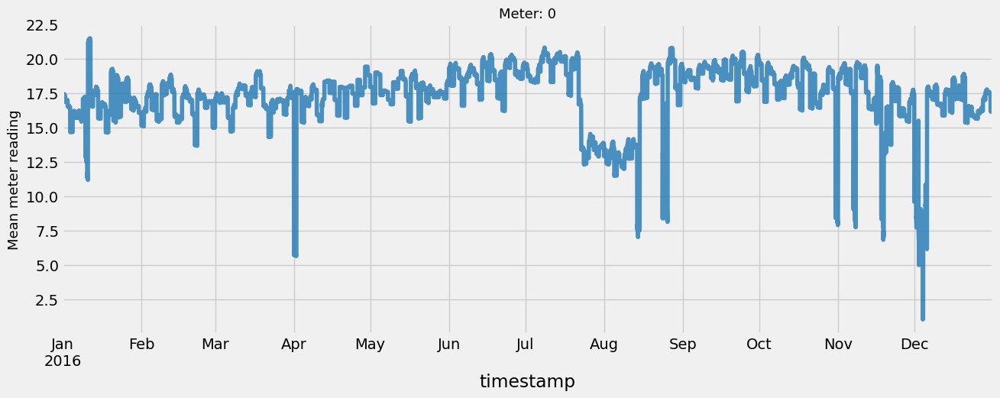

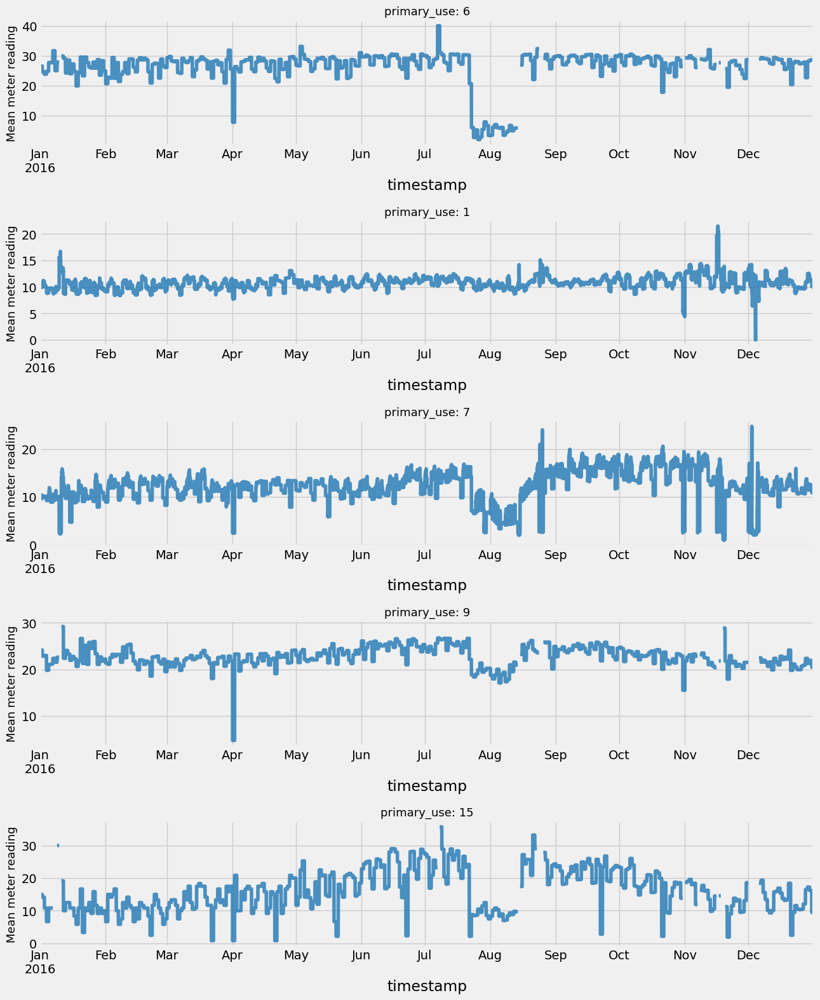

In [52]:
fig, axes = plt.subplots(1,1,figsize=(14, 5), dpi=100)
for i in list( train_df[(train_df['site_id'] == 8)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 8) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes.set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

cond= train_df[(train_df['site_id'] == 8)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 8) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Checking Site 10

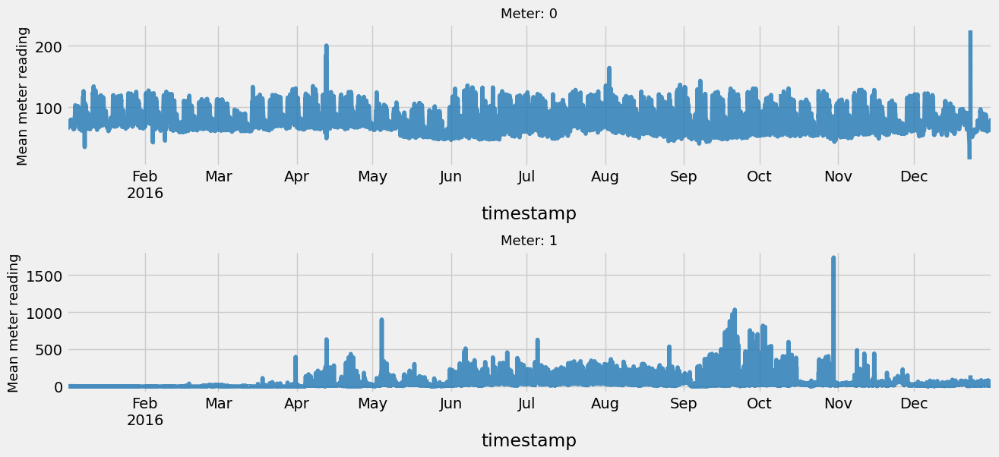

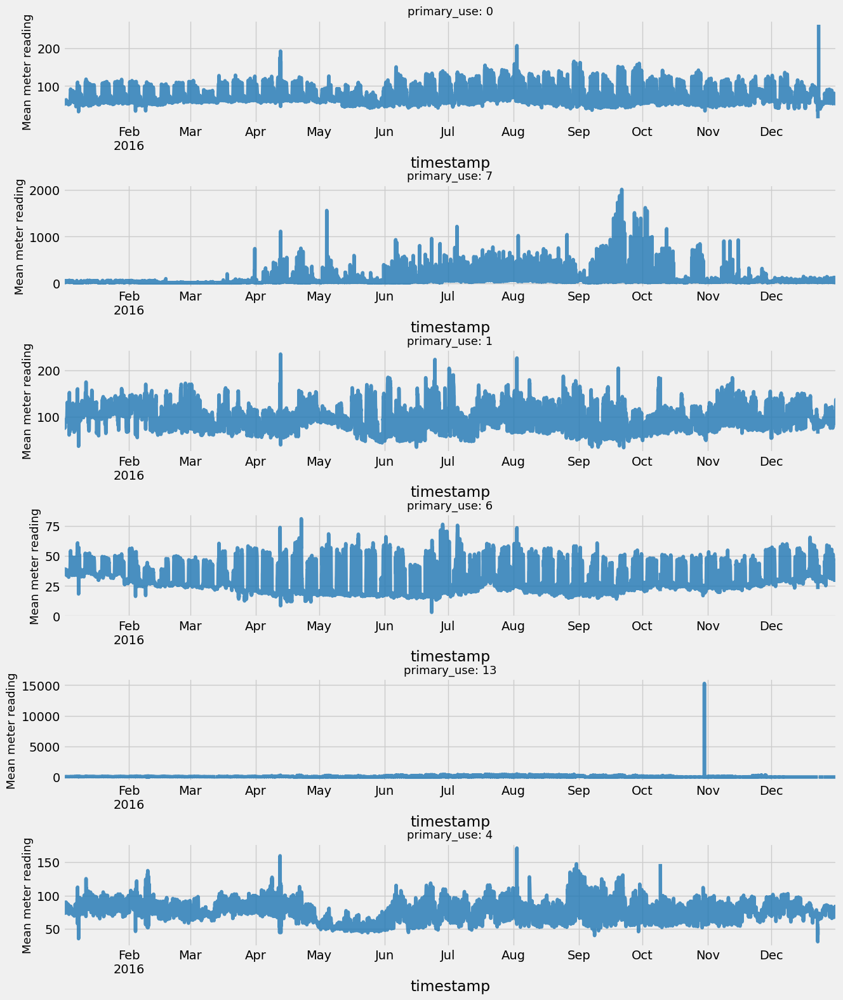

In [53]:
fig, axes = plt.subplots(2,1,figsize=(14, 6), dpi=100)
for i in list( train_df[(train_df['site_id'] == 10)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 10) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes[i].set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

cond= train_df[(train_df['site_id'] == 10)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 10) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

In [54]:
condition_df= train_df[(train_df['site_id'] == 10)& (train_df.primary_use==0) ]
clipped_values= condition_df.meter_reading.clip( upper=150, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

# dropping primary use 7, 13 as it's range is just so suspecious 
condition= train_df[(train_df['site_id'] == 10) & (train_df.primary_use.isin([7,13])) ]
train_df.drop(index=condition.index , inplace=True)

condition_df= train_df[(train_df['site_id'] == 10) & (train_df.primary_use==13)&(train_df.month==10) ]
clipped_values= condition_df.meter_reading.clip( upper=400, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

condition_df= train_df[(train_df['site_id'] == 10) & (train_df.primary_use==4) ]
clipped_values= condition_df.meter_reading.clip( upper=90, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

condition_df= train_df[(train_df['site_id'] == 10) & (train_df.primary_use==1) ]
clipped_values= condition_df.meter_reading.clip( upper=125, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

condition_df= train_df[(train_df['site_id'] == 10) & (train_df.meter==0)]
clipped_values= condition_df.meter_reading.clip( upper=80, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

### Visualizing after clipping at Site 10

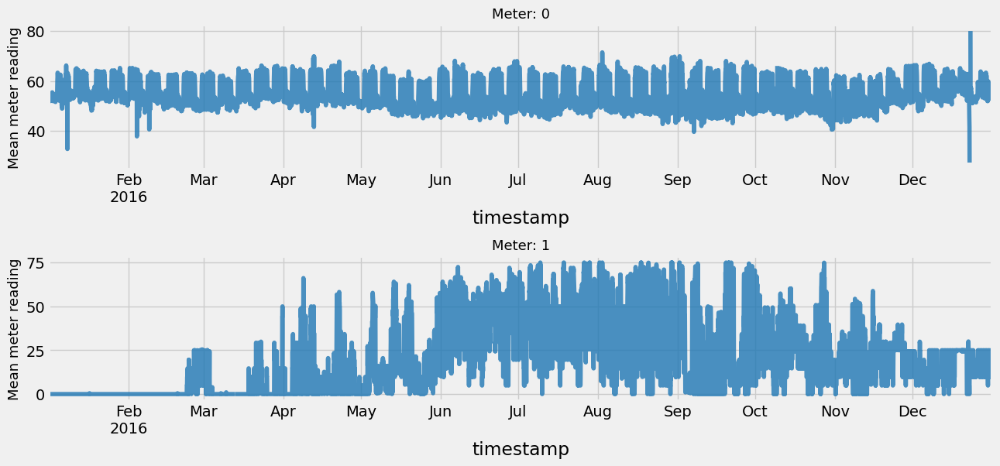

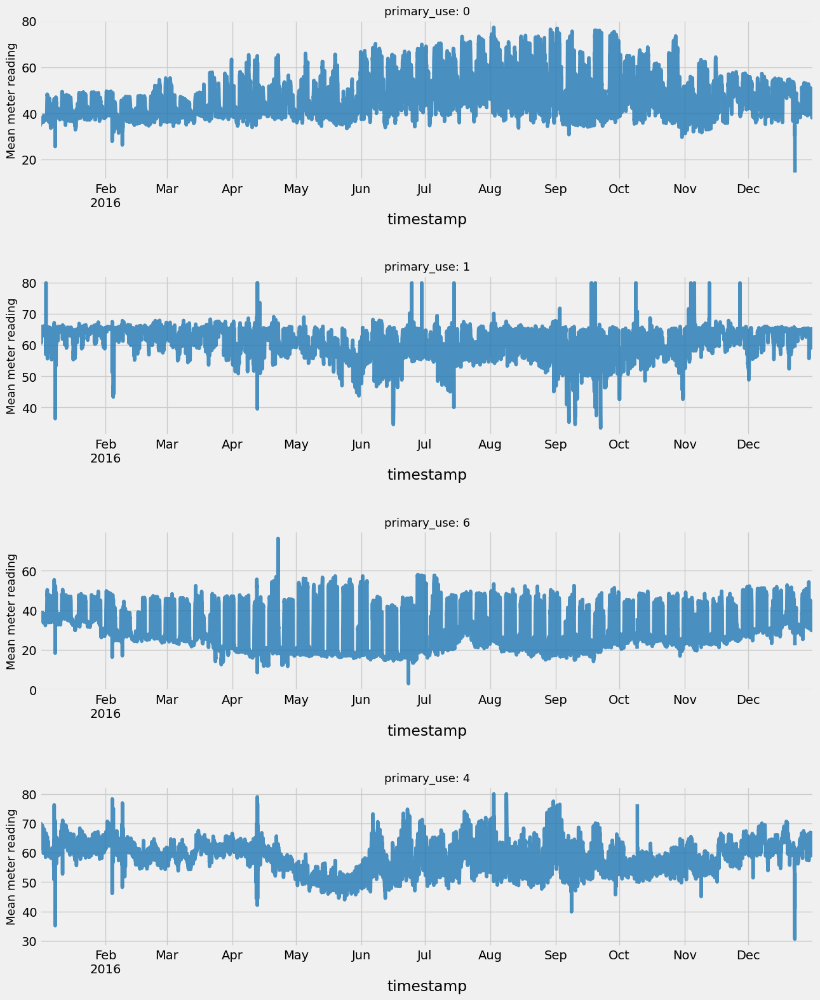

In [55]:
fig, axes = plt.subplots(2,1,figsize=(14, 6), dpi=100)
for i in list( train_df[(train_df['site_id'] == 10)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 10) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes[i].set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

cond= train_df[(train_df['site_id'] == 10)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 10) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Checking Site 11

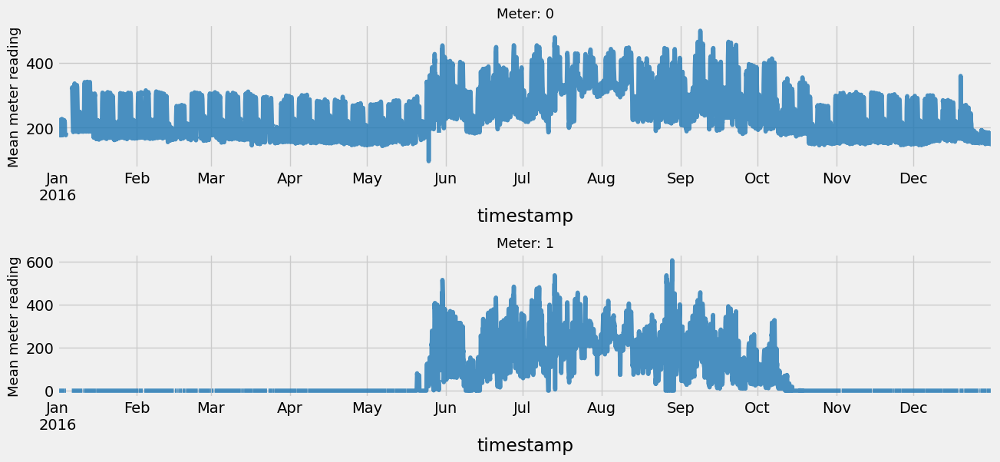

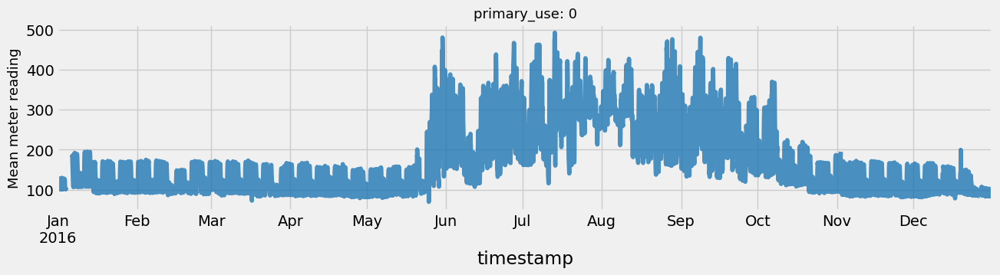

In [56]:
fig, axes = plt.subplots(2,1,figsize=(14, 6), dpi=100)
for i in list( train_df[(train_df['site_id'] == 11)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 11) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes[i].set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

cond= train_df[(train_df['site_id'] == 11)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 3), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 11) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes.set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Dropping meter 1 as the missing data is skewing the graph

In [57]:
cond= train_df[(train_df['site_id'] == 11) & (train_df.meter==1)]
train_df.drop(index=cond.index, inplace=True)

### Visualizing after removing data at site 11

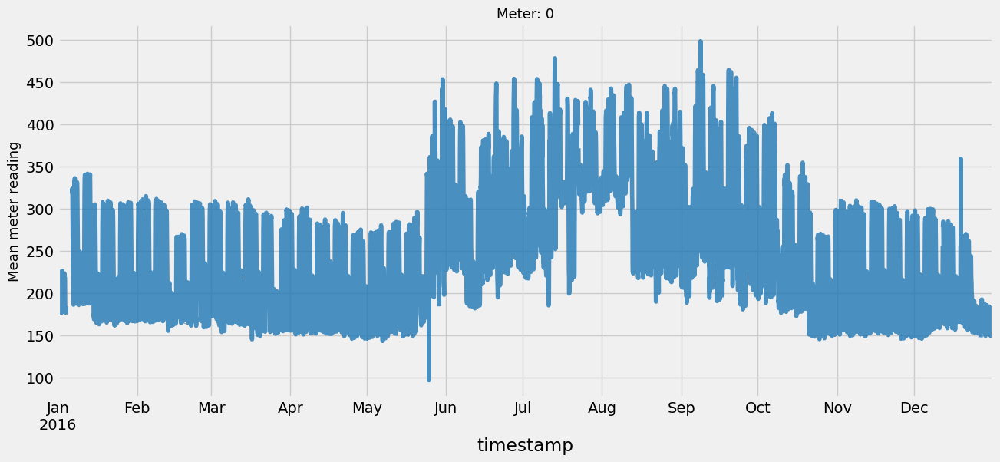

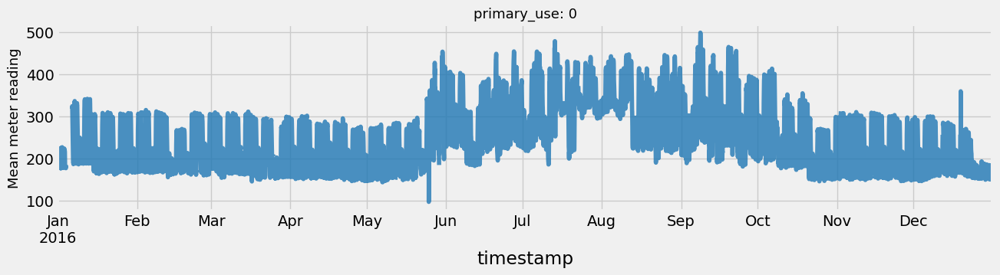

In [58]:
fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
for i in list( train_df[(train_df['site_id'] == 11)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 11) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes.set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

cond= train_df[(train_df['site_id'] == 11)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 3), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 11) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes.set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Checking Site 14

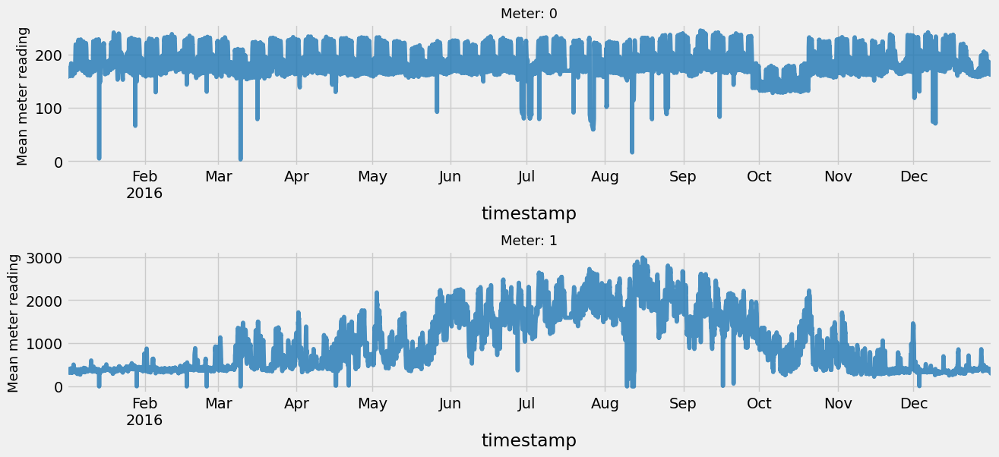

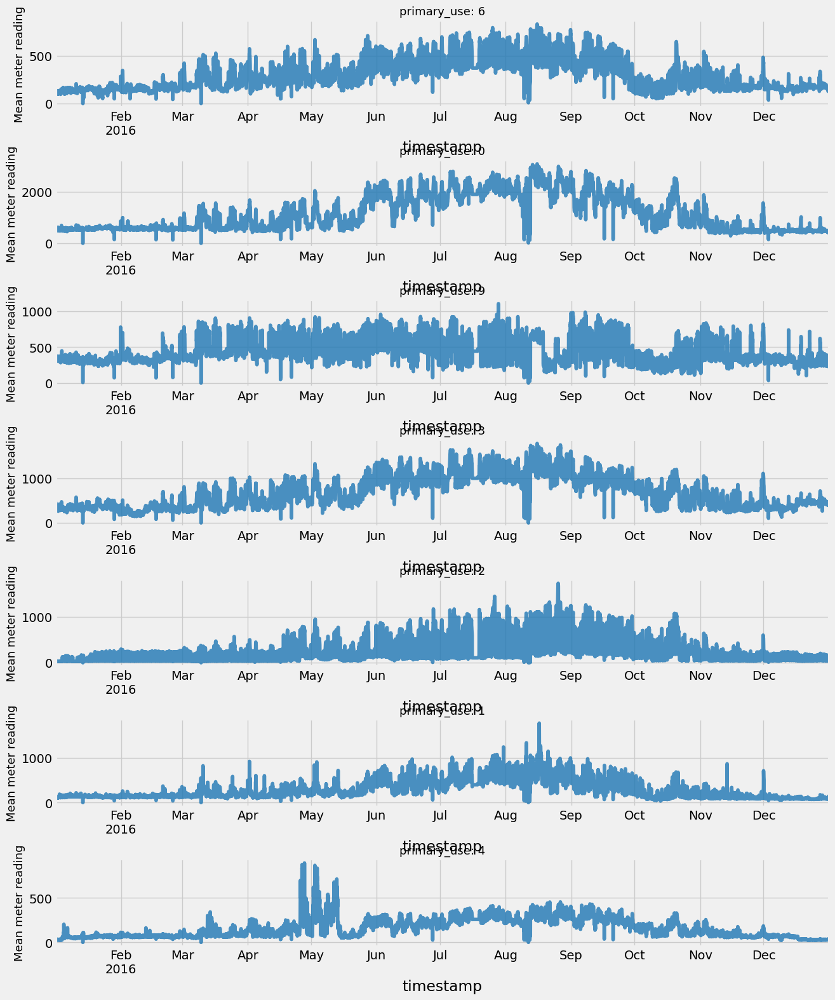

In [59]:
fig, axes = plt.subplots(2,1,figsize=(14, 6), dpi=100)
for i in list( train_df[(train_df['site_id'] == 10)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 14) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes[i].set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

cond= train_df[(train_df['site_id'] == 14)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 14) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

#### as we can see meter 1 is so huge that it creates an unbalanced data, so we will try visualizing without it

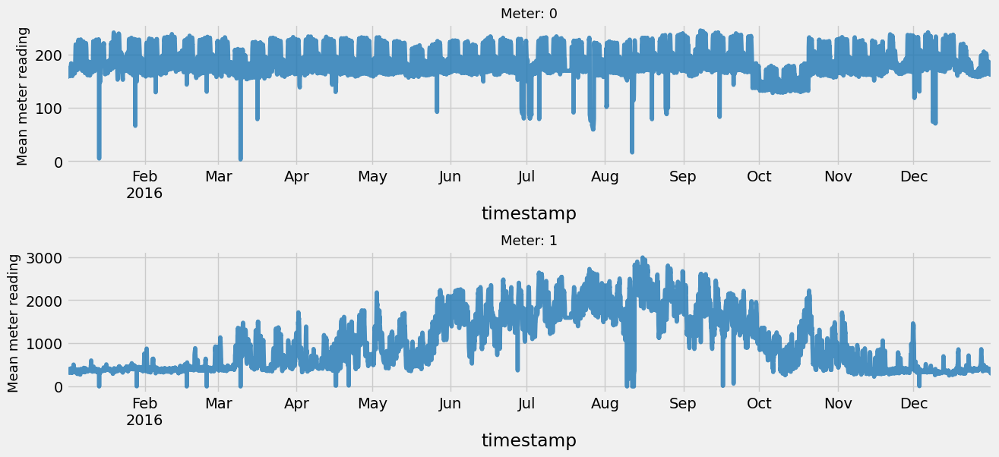

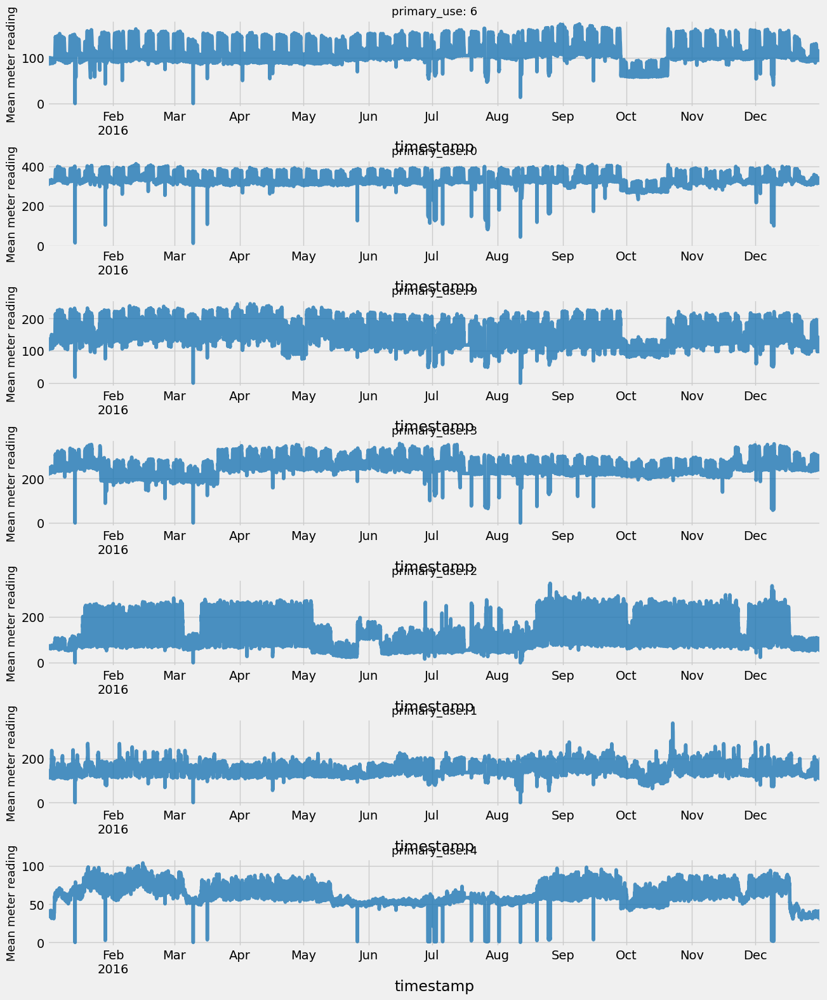

In [60]:
# visualizing without meter 1

fig, axes = plt.subplots(2,1,figsize=(14, 6), dpi=100)
for i in list( train_df[(train_df['site_id'] == 10)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 14) & (train_df['meter'] == i)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes[i].set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

cond= train_df[(train_df['site_id'] == 14)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 14) & (train_df['primary_use'] == i) & (train_df.meter ==0) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

#### we clearly see that meter 1 has some problems with it, so we will drop it and clip some outliers

In [61]:
condition_df= train_df[(train_df['site_id'] == 14)& (train_df.primary_use==1) ]
clipped_values= condition_df.meter_reading.clip( upper=230, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

# dropping primary use 7, 13 as it's range is just so suspecious 
condition= train_df[(train_df['site_id'] == 14) & (train_df.meter==1) ]
train_df.drop(index=condition.index , inplace=True)

condition_df= train_df[(train_df['site_id'] == 14) & (train_df.primary_use==2)]
clipped_values= condition_df.meter_reading.clip( upper=250, axis=0)
clipped_idx= condition_df.index
train_df.loc[clipped_idx,'meter_reading']= clipped_values

### visualizing after removing outliers at site 14

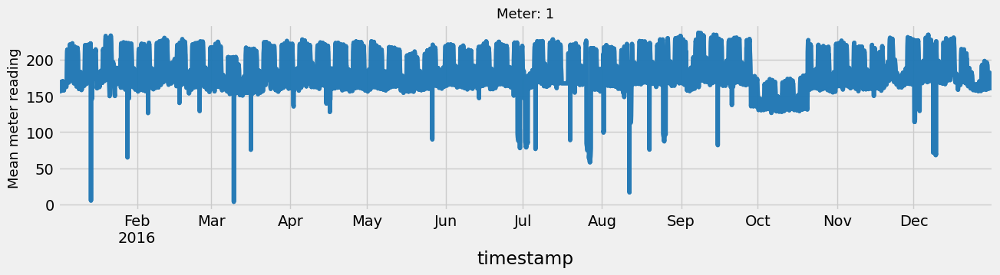

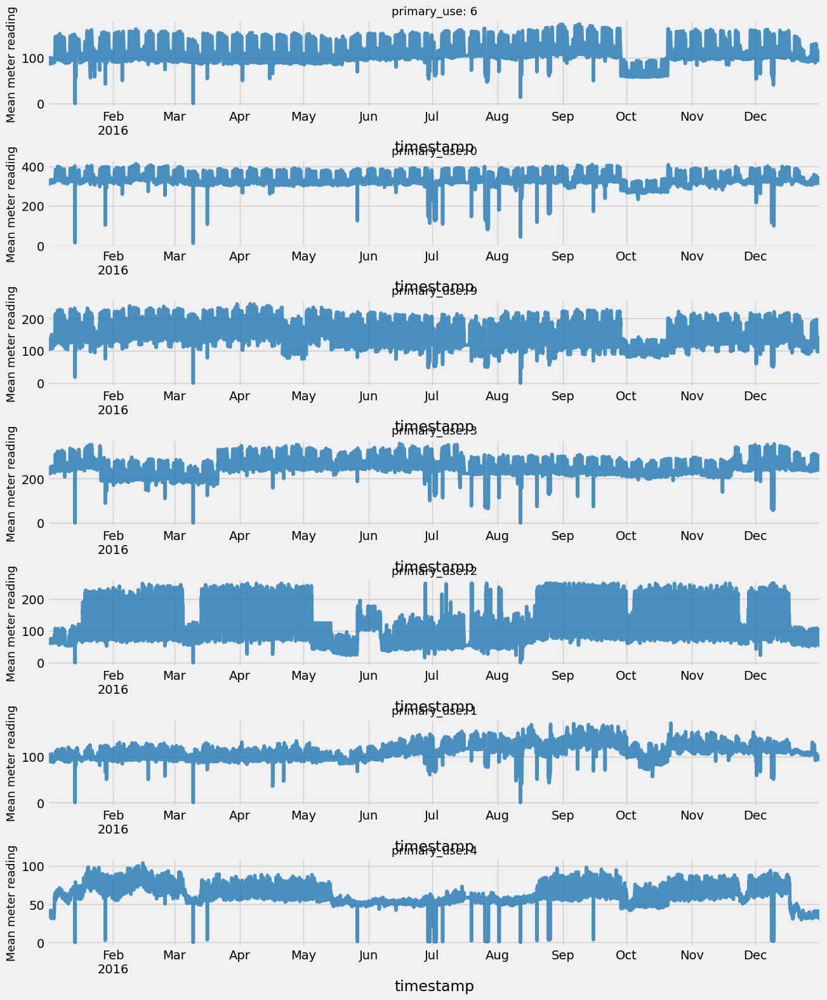

In [62]:
# visualizing without meter 1

fig, axes = plt.subplots(1,1,figsize=(14, 3), dpi=100)
for i in list( train_df[(train_df['site_id'] == 10)]['meter'].unique() ) :
    train_df[(train_df['site_id'] == 14)][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    axes.set_title('Meter: ' + str(i), fontsize=13);
    plt.subplots_adjust(hspace=0.6)

cond= train_df[(train_df['site_id'] == 14)]
fig, axes = plt.subplots(len(cond['primary_use'].unique()),
                         1,figsize=(14, 18), dpi=100)
counter_var=0
for i in list( cond['primary_use'].unique() ) :
    train_df[ (train_df['site_id'] == 14) & (train_df['primary_use'] == i) ] [['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[counter_var], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13)
    axes[counter_var].set_title('primary_use: ' + str(i), fontsize=13);
    counter_var+=1
    plt.subplots_adjust(hspace=0.6)

### Revisualizing all sites after preprocessing

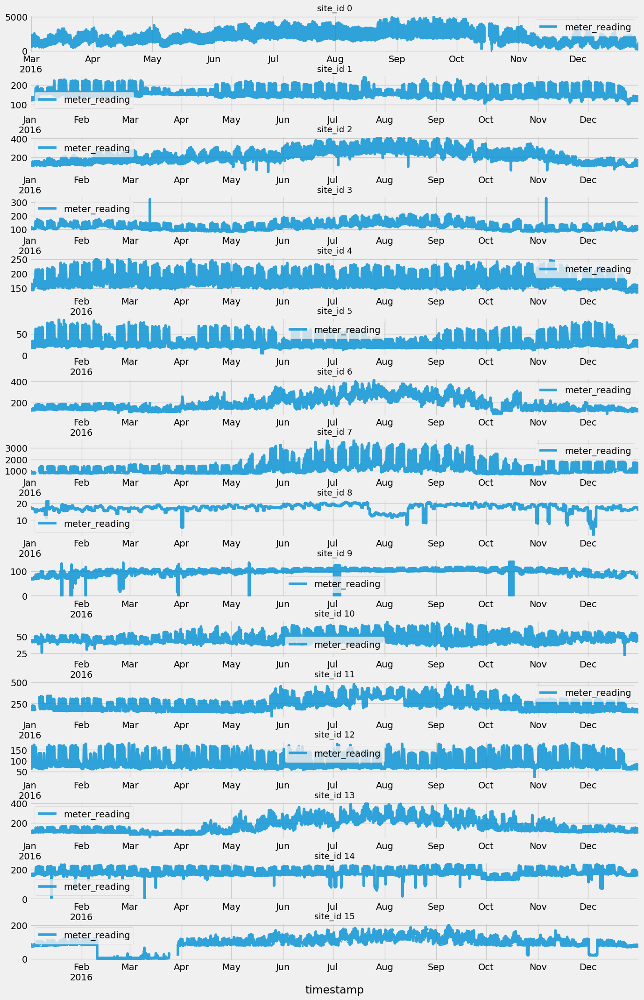

In [63]:
fig, axes = plt.subplots(16,figsize=(15, 25), dpi=100)
for i in range(train_df['site_id'].nunique()):
    try:
        train_df[train_df['site_id'] == i][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean().plot(ax=axes[i], alpha=0.8, label='By hour')
        axes[i].set_title('site_id {}'.format(i), fontsize=13);
        plt.subplots_adjust(hspace=0.6)
    except: pass

C:\Users\joeyi\AppData\Local\Temp\ipykernel_26848\3279230321.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



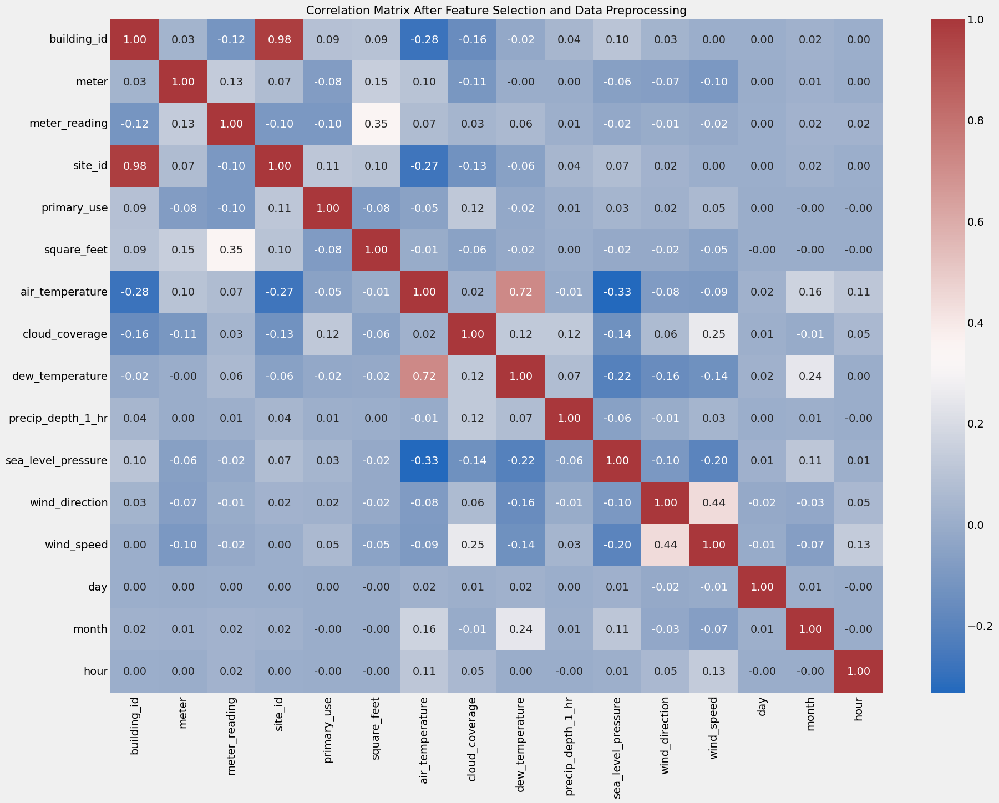

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns

# Generate correlation matrix
correlation_matrix = train_df.corr()

# Plot heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='vlag', fmt=".2f")
plt.title('Correlation Matrix After Feature Selection and Data Preprocessing', fontsize= 15)
plt.show()


In [65]:
correlation_matrix = train_df.corr()
print(correlation_matrix)

C:\Users\joeyi\AppData\Local\Temp\ipykernel_26848\737654371.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



                    building_id         meter  meter_reading   site_id  \
building_id            1.000000  3.197659e-02      -0.115158  0.976335   
meter                  0.031977  1.000000e+00       0.132170  0.068428   
meter_reading         -0.115158  1.321702e-01       1.000000 -0.101005   
site_id                0.976335  6.842786e-02      -0.101005  1.000000   
primary_use            0.088863 -7.915702e-02      -0.099264  0.112063   
square_feet            0.091878  1.459826e-01       0.345093  0.096578   
air_temperature       -0.282664  9.634308e-02       0.065849 -0.269846   
cloud_coverage        -0.156580 -1.081876e-01       0.032217 -0.131066   
dew_temperature       -0.020962 -2.756078e-03       0.056705 -0.057658   
precip_depth_1_hr      0.040131  7.855608e-04       0.010243  0.038608   
sea_level_pressure     0.104127 -6.314409e-02      -0.024317  0.073602   
wind_direction         0.026919 -7.151497e-02      -0.005297  0.023922   
wind_speed             0.002728 -9.896

In [66]:
print("Shape of train_df:", train_df.shape)
print("Column names of train_df:", train_df.columns.tolist())
print()

Shape of train_df: (14036481, 17)
Column names of train_df: ['building_id', 'meter', 'timestamp', 'meter_reading', 'site_id', 'primary_use', 'square_feet', 'air_temperature', 'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure', 'wind_direction', 'wind_speed', 'day', 'month', 'hour']



In [68]:
train_df.to_csv('D:/Downloads/final-year-project/data/preprocessed_train_data.csv')
test_df.to_csv('D:/Downloads/final-year-project/data/preprocessed_test_data.csv')